***IMPORTING THE LIBRARIES***

In [250]:
import warnings
warnings.filterwarnings('ignore')

In [251]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns 
pd.set_option('display.max_columns', None)

In [252]:
import datetime as dt 
import math 
from math import radians 
import calendar 
from sklearn import preprocessing
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,plot_roc_curve 
from sklearn.metrics import f1_score,recall_score
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE,ADASYN
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics

***LOADING DATA TO DATAFRAME***

In [194]:
df_train = pd.read_csv('C:/Users/deepak.ramesh/Downloads/UPGRAD/LIBA/capestone/fraudTrain.csv')
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


***EXPLORATORY DATA ANALYSIS***

In [195]:
df_train.shape

(1296675, 23)

In [196]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

**Inspecting the count of categories in each feature/class/column**

In [197]:
df = df_train.select_dtypes(exclude='number')
result = df_train.apply(pd.Series.nunique)
result

Unnamed: 0               1296675
trans_date_trans_time    1274791
cc_num                       983
merchant                     693
category                      14
amt                        52928
first                        352
last                         481
gender                         2
street                       983
city                         894
state                         51
zip                          970
lat                          968
long                         969
city_pop                     879
job                          494
dob                          968
trans_num                1296675
unix_time                1274823
merch_lat                1247805
merch_long               1275745
is_fraud                       2
dtype: int64

In [198]:
df_train.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [199]:
pd.set_option("display.max_rows", None)
df_train.city.value_counts()

Birmingham                   5617
San Antonio                  5130
Utica                        5105
Phoenix                      5075
Meridian                     5060
Thomas                       4634
Conway                       4613
Cleveland                    4604
Warren                       4599
Houston                      4168
Burbank                      4159
Naples                       4155
Arcadia                      4096
Indianapolis                 4073
Brandon                      4044
Fulton                       3977
Lahoma                       3646
Allentown                    3639
Lakeland                     3635
Dallas                       3629
Washington                   3613
Andrews                      3599
Detroit                      3584
Huntsville                   3560
Hudson                       3547
Orient                       3545
Fort Washakie                3527
Philadelphia                 3517
Uledi                        3123
Elberta       

In [200]:
df_train.street.value_counts()

0069 Robin Brooks Apt. 695             3123
864 Reynolds Plains                    3123
8172 Robertson Parkways Suite 072      3119
4664 Sanchez Common Suite 930          3117
8030 Beck Motorway                     3113
29606 Martinez Views Suite 653         3112
1652 James Mews                        3110
854 Walker Dale Suite 488              3107
40624 Rebecca Spurs                    3106
594 Berry Lights Apt. 392              3101
2870 Bean Terrace Apt. 756             3099
574 David Locks Suite 207              3095
6033 Young Track Suite 804             3090
3379 Williams Common                   3090
7202 Jeffrey Mills                     3088
7618 Gonzales Mission                  3087
4038 Smith Avenue                      3083
7952 Karen Pike                        3082
72966 Shannon Pass Apt. 391            3081
2481 Mills Lock                        3080
27479 Reeves Dale                      3077
561 Little Plain Apt. 738              3074
11014 Chad Lake Apt. 573        

**In-order to proceed with the further analysis, we need to do label encoding for categorical variables. We dont know which label will be encoded to which value, so in-order to know that we perform**

In [201]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
labels = df_train.merchant.unique()

# Encoding the labels
encoder.fit(labels)

# acesses the encoded labels
encoded_labels = encoder.transform(labels)

# mapping encoded labels to original labels
decoded_labels = encoder.inverse_transform(encoded_labels)

# Display the mapping of labels to encoded values
print(dict(zip(decoded_labels, encoded_labels)))

{'fraud_Rippin, Kub and Mann': 514, 'fraud_Heller, Gutmann and Zieme': 241, 'fraud_Lind-Buckridge': 390, 'fraud_Kutch, Hermiston and Farrell': 360, 'fraud_Keeling-Crist': 297, 'fraud_Stroman, Hudson and Erdman': 607, 'fraud_Rowe-Vandervort': 534, 'fraud_Corwin-Collins': 107, 'fraud_Herzog Ltd': 250, 'fraud_Schoen, Kuphal and Nitzsche': 563, 'fraud_Rutherford-Mertz': 543, 'fraud_Kerluke-Abshire': 304, 'fraud_Lockman Ltd': 394, 'fraud_Kiehn Inc': 308, 'fraud_Beier-Hyatt': 42, 'fraud_Schmidt and Sons': 557, 'fraud_Lebsack and Sons': 379, 'fraud_Mayert Group': 409, 'fraud_Konopelski, Schneider and Hartmann': 331, 'fraud_Schultz, Simonis and Little': 570, 'fraud_Bauch-Raynor': 29, 'fraud_Harris Inc': 231, 'fraud_Kling-Grant': 324, 'fraud_Pacocha-Bauch': 467, 'fraud_Lesch Ltd': 387, 'fraud_Kunde-Sanford': 351, "fraud_Deckow-O'Conner": 130, 'fraud_Bruen-Yost': 82, 'fraud_Kunze Inc': 352, 'fraud_Nitzsche, Kessler and Wolff': 454, 'fraud_Kihn, Abernathy and Douglas': 311, 'fraud_Torphy-Goyette'

**Label encoding for categorial variables**

In [202]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df_train['merchant'] = label_encoder.fit_transform(df_train['merchant'])
df_train['category'] = label_encoder.fit_transform(df_train['category'])
df_train['gender'] = label_encoder.fit_transform(df_train['gender'])
df_train['street'] = label_encoder.fit_transform(df_train['street'])
df_train['city'] = label_encoder.fit_transform(df_train['city'])
df_train['state'] = label_encoder.fit_transform(df_train['state'])
df_train['job'] = label_encoder.fit_transform(df_train['job'])
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [203]:
#colsNum = df_train.select_dtypes(np.number).columns
#colsObj = df_train.columns.difference(colsNum)

#encoder = {}

#for col in colsObj:
    #encoder[col] = preprocessing.LabelEncoder()
    #df_train[col] = encoder[col].fit_transform(df_train[col])
#print(df_train.head())

#for col in colsObj:
    #df_train[col] = encoder[col].inverse_transform(df_train[col])
#print(df_train.head())

In [204]:
df_train.street.value_counts()

6      3123
859    3123
814    3119
472    3117
805    3113
303    3112
160    3110
848    3107
417    3106
601    3101
288    3099
577    3095
608    3090
350    3090
717    3088
768    3087
416    3083
800    3082
727    3081
242    3080
274    3077
567    3074
103    3074
585    3072
541    3071
516    3064
384    3061
89     3056
603    3055
261    3054
230    3051
744    3046
194    3045
321    3040
27     3039
363    3038
474    3034
79     3032
435    3030
522    3027
300    3027
173    3026
894    3026
720    3023
32     3011
901    3006
432    2973
439    2949
69     2949
613    2922
695    2918
449    2918
635    2915
106    2619
772    2611
722    2603
0      2602
324    2599
334    2597
18     2591
672    2590
362    2588
850    2587
576    2587
972    2585
137    2585
835    2584
582    2582
394    2578
767    2578
920    2577
319    2576
375    2574
281    2573
256    2572
108    2572
134    2572
716    2570
90     2568
157    2566
268    2566
421    2565
778    2564
315 

In [205]:
df_train.category.value_counts()

2     131659
4     123638
6     123115
12    116672
7     113035
11     97543
0      94014
1      91461
10     90758
5      85879
9      79655
8      63287
3      45452
13     40507
Name: category, dtype: int64

In [206]:
df_train.state.value_counts()

43    94876
34    83501
38    79847
4     56360
35    46480
22    46154
14    43252
9     42671
1     40989
24    38403
23    31714
2     31127
27    30266
48    29368
45    29250
40    29190
17    28475
15    27580
12    26985
36    26671
20    26193
10    26063
49    25691
31    24603
29    24168
16    22996
25    21188
18    20965
50    19322
47    18924
37    18597
42    17554
21    16505
32    16407
28    14786
5     13880
19    12376
41    12324
46    11768
26    11754
3     10770
44    10699
30     8278
6      7702
33     5607
13     5545
7      3613
11     2559
0      2120
39      550
8         9
Name: state, dtype: int64

**Since there is lot of categories for each feature/independent variable/column so, quantizing each category would be very time consuming and tedious task. So we can proceed with Decision Tree/Random forest algorithm as they are Robust to these kind of challenges**

***EXTRACTING DATE, TIME, HOUR, MONTH, ETC***

In [207]:
df_train['Trans_time'] = pd.to_datetime(df_train['trans_date_trans_time']).dt.hour
df_train.Trans_time.value_counts()

23    67104
22    66982
18    66051
16    65726
21    65533
19    65508
17    65450
15    65391
13    65314
12    65257
20    65098
14    64885
1     42869
3     42769
2     42656
8     42505
0     42502
6     42300
10    42271
7     42203
9     42185
5     42171
11    42082
4     41863
Name: Trans_time, dtype: int64

In [208]:
df_train['Trans_date'] = pd.to_datetime(df_train['trans_date_trans_time']).dt.date
df_train['Trans_date'] = pd.to_datetime(df_train['Trans_date'])
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01


In [209]:
df_train['dob']= pd.to_datetime(df_train['dob'])
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01


In [210]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 25 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   Unnamed: 0             1296675 non-null  int64         
 1   trans_date_trans_time  1296675 non-null  object        
 2   cc_num                 1296675 non-null  int64         
 3   merchant               1296675 non-null  int32         
 4   category               1296675 non-null  int32         
 5   amt                    1296675 non-null  float64       
 6   first                  1296675 non-null  object        
 7   last                   1296675 non-null  object        
 8   gender                 1296675 non-null  int32         
 9   street                 1296675 non-null  int32         
 10  city                   1296675 non-null  int32         
 11  state                  1296675 non-null  int32         
 12  zip                    12966

In [211]:
df_train['Present_Age'] = round((df_train['Trans_date'] - df_train['dob'])/np.timedelta64(1, 'Y'))
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0


In [212]:
df_train['Day_of_week'] = df_train.Trans_date.dt.dayofweek
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0,1
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0,1
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0,1
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0,1
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0,1


**0 is being considered as Monday**

In [213]:
df_train['Month'] = df_train['Trans_date'].dt.month
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0,1,1
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0,1,1
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0,1,1
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0,1,1
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0,1,1


In [214]:
def Haversinedist(lat1,long1,lat2,long2):
  R = 6373.0
  dlat = radians(lat2-lat1)
  dlong = radians(long2-long1)
  a =  math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlong / 2)**2
  c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
  d = R*c
  return round(d,4)

In [215]:
Dist = []

for p,q,r,s in zip(df_train['lat'],df_train['long'],df_train['merch_lat'],df_train['merch_long']):
  Dist.append(Haversinedist(p,q,r,s))

In [216]:
df_train['Distance']= Dist
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0,1,1,10.5130
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0,1,1,30.1809
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0,1,1,107.7801
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0,1,1,97.6600
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0,1,1,66.2568


In [217]:
df_train['Present_Age'].max(), df_train['Present_Age'].min()

(96.0, 14.0)

**Converting age to categorical variable as it is continous and since it would be easy to interpret**

In [218]:
df_train['Age_category'] = pd.cut(x=df_train['Present_Age'], bins=[0,10,20,30,40,50,60,70,80,90,100],labels=['0-10','10-20','20-30','30-40','40-50','50-60','60-70','70-80','80-90','90-100'])
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0,1,1,10.5130,30-40
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0,1,1,30.1809,40-50
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0,1,1,107.7801,50-60
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0,1,1,97.6600,50-60
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0,1,1,66.2568,30-40


In [219]:
df_train['Age_category'].value_counts()

40-50     303491
30-40     288784
20-30     213729
50-60     184973
60-70     131849
70-80      70911
10-20      43042
80-90      42200
90-100     17696
0-10           0
Name: Age_category, dtype: int64

**Label Encoding for Age_category**

In [220]:
df_train['Age_category'] = label_encoder.fit_transform(df_train['Age_category'])

**'amt' is being choosen to be dropped since our objective is a clasffication problem wether a transaction will be fraud or not and not the regression problem of predicting the fraud amount. Some of the other variables which do not make sense to be considered for analysis and may hamper our likelyhood of prediction**

In [221]:
df_train1 = df_train.drop(['trans_date_trans_time','first','last','lat','long', 'Unnamed: 0','cc_num', 'zip', 'amt', 'trans_num', 'unix_time','merch_lat','merch_long'],axis=1)
df_train1.head()

,merchant,category,gender,street,city,state,city_pop,job,dob,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
0,514,8,0,568,526,27,3495,370,1988-03-09,0,0,2019-01-01,31.0,1,1,10.5130,2
1,241,4,0,435,612,47,149,428,1978-06-21,0,0,2019-01-01,41.0,1,1,30.1809,3
2,390,0,1,602,468,13,4154,307,1962-01-19,0,0,2019-01-01,57.0,1,1,107.7801,4
3,360,2,1,930,84,26,1939,328,1967-01-12,0,0,2019-01-01,52.0,1,1,97.6600,4
4,297,9,1,418,216,45,99,116,1986-03-28,0,0,2019-01-01,33.0,1,1,66.2568,2


In [222]:
classes = df_train1['is_fraud'].value_counts()
normal_trans = classes[0]/df_train1['is_fraud'].count()*100
fraud_trans = classes [1]/df_train1['is_fraud'].count()*100
normal_trans,fraud_trans

(99.42113482561166, 0.5788651743883394)

**Therefore it is clearly visile almost 99.5% accounts for normal transaction and only 0.5% account for fraud transctions, so we need to handle the class imbalance**

**Digging out the correlations/patterns within fraudulent transaction**

**First filtering out the fraudulent transactions**

In [223]:
df_train_fraud = df_train1[df_train1.is_fraud==1]
df_train_fraud.head()

,merchant,category,gender,street,city,state,city_pop,job,dob,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
2449,543,4,1,544,165,27,885,425,1988-09-15,1,1,2019-01-02,30.0,2,1,46.9040,1
2472,285,2,0,280,725,43,1595797,228,1960-10-28,1,1,2019-01-02,58.0,2,1,42.8870,4
2523,196,4,0,280,725,43,1595797,228,1960-10-28,1,3,2019-01-02,58.0,2,1,26.8440,4
2546,162,2,1,544,165,27,885,425,1988-09-15,1,3,2019-01-02,30.0,2,1,11.7315,1
2553,328,4,0,280,725,43,1595797,228,1960-10-28,1,3,2019-01-02,58.0,2,1,38.7194,4


In [224]:
df_train_fraud.shape

(7506, 17)

In [225]:
classes = df_train_fraud['gender'].value_counts()
Female = classes[0]/df_train_fraud['gender'].count()*100
Male = classes [1]/df_train_fraud['gender'].count()*100
Male,Female
#{'F': 0, 'M': 1} refer initial lines of code

(50.23980815347721, 49.76019184652279)

In [226]:
def without_hue(ax, feature):
    total = len(feature)
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

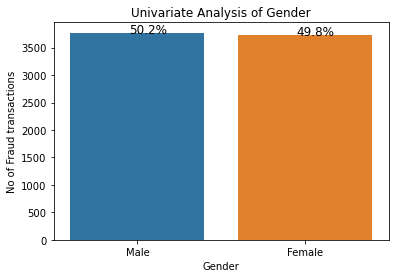

In [238]:
x=['Male','Female']
y= [df_train_fraud.gender.value_counts()[1],df_train_fraud.gender.value_counts()[0]]
ax = sns.barplot(x=x,y=y)

plt.xlabel('Gender',size=10)
plt.ylabel('No of Fraud transactions',size=10)

plt.title('Univariate Analysis of Gender')

without_hue(ax,df_train_fraud.gender)
plt.savefig('myplot.png')

**Both male and female categories have almost equaly likelihood for being victims of fruad**

In [229]:
#data frame of non fraudulent transaction
df_train_non_fraud = df_train1[(df_train1['is_fraud']== 0)] 

**Analysisng fraudulent transactions on week basis**

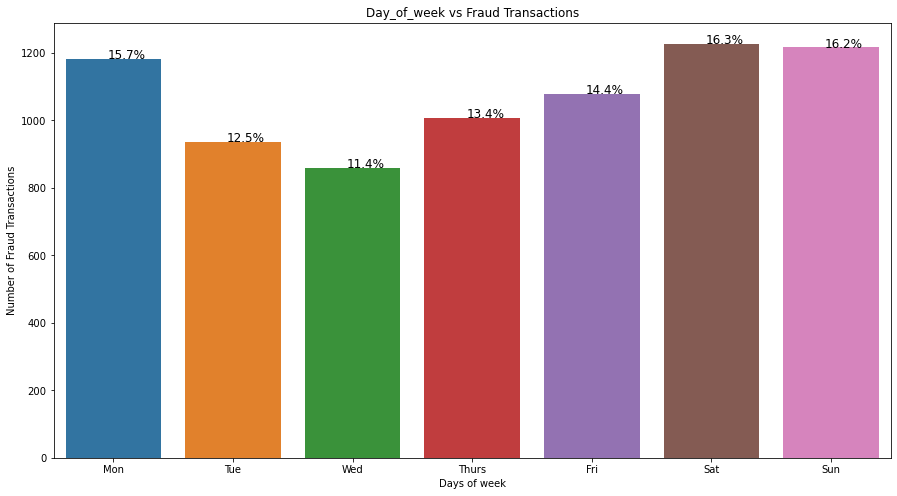

In [243]:
plt.figure(figsize=[15,8])

ax= sns.countplot(df_train_fraud['Day_of_week'])

for p in ax.patches:
        total = len(df_train_fraud['is_fraud'])
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

week = ['Mon','Tue','Wed','Thurs','Fri','Sat','Sun']   
x_ticks = [0,1,2,3,4,5,6]
ax.set_title('Day_of_week vs Fraud Transactions')
ax.set_ylabel('Number of Fraud Transactions')
ax.set_xlabel('Days of week')
ax.set_xticks(x_ticks)
ax.set_xticklabels(week)
plt.savefig('myplot1.png')
plt.show()

**Highest number of the fraudulent transactions occur on Saturday, followed by Sunday, Monday and so on**

**Analysisng fraudulent transactions on month basis**

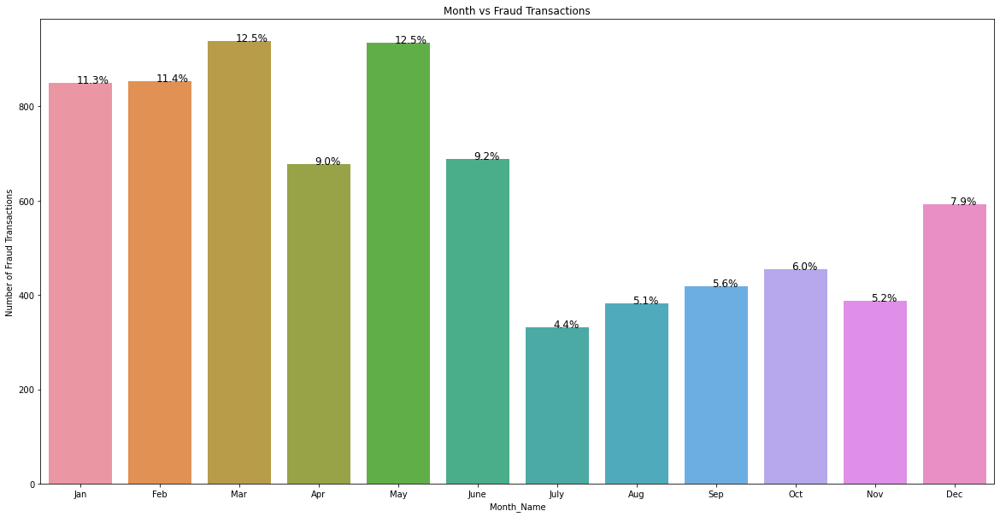

In [244]:
plt.figure(figsize=[20,10])

ax= sns.countplot(df_train_fraud['Month'])

for p in ax.patches:
        total = len(df_train_fraud['is_fraud'])
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)


x_ticks = [0,1,2,3,4,5,6,7,8,9,10,11]
month_name = ['Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec']

ax.set_title('Month vs Fraud Transactions')
ax.set_ylabel('Number of Fraud Transactions')
ax.set_xlabel('Month_Name')

ax.set_xticks(x_ticks)
ax.set_xticklabels(month_name)

plt.savefig('myplot2.png')
plt.show()

**On an average most of the fraudulent transactions occur in 4th quarter followed by 1st quarter and so on and is highest during March and May months**

**Analysisng fraudulent transactions on hourly basis**

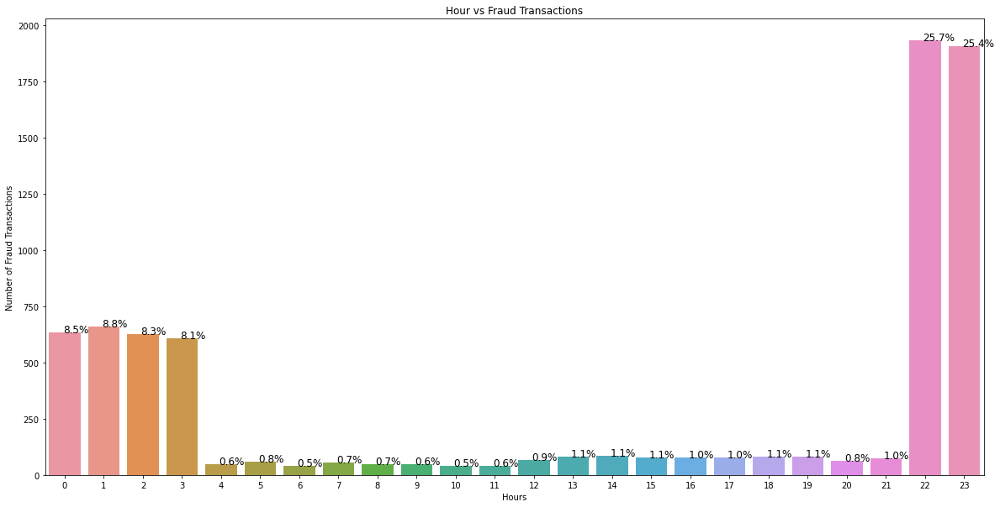

In [245]:
plt.figure(figsize=[20,10])

ax= sns.countplot(df_train_fraud['Trans_time'])

for p in ax.patches:
        total = len(df_train_fraud['is_fraud'])
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

ax.set_title('Hour vs Fraud Transactions')
ax.set_ylabel('Number of Fraud Transactions')
ax.set_xlabel('Hours')

plt.savefig('myplot3.png')
plt.show()

**Most of the Fraudulent transactions happen during late night from 22:00:00 and is highenst beyween the time interval 22:00:00 to 23:00:00 followed by the time interval 23:00:00 to 00:00:00 and so on**

**Analysisng fraudulent transactions on Age basis**

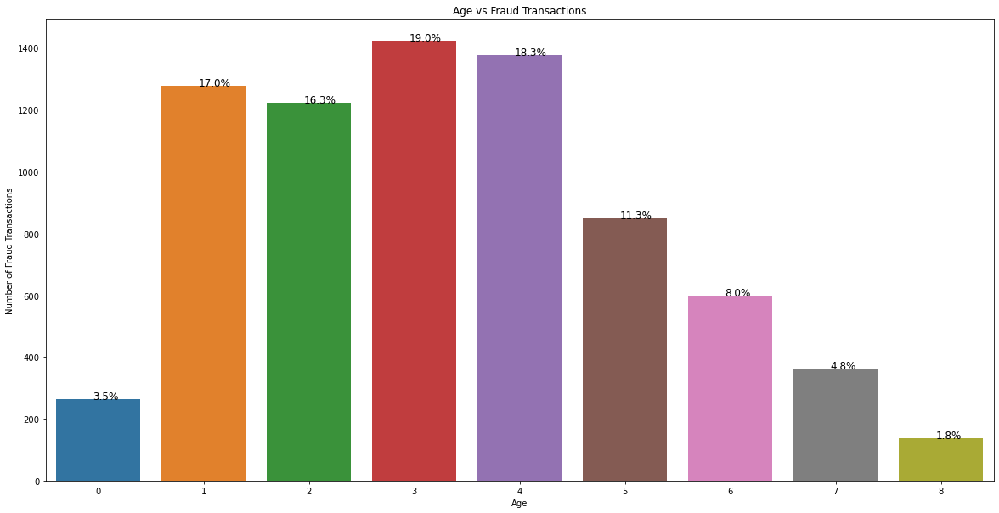

In [246]:
plt.figure(figsize=[20,10])

ax= sns.countplot(df_train_fraud['Age_category'])

for p in ax.patches:
        total = len(df_train_fraud['is_fraud'])
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width() / 2 - 0.05
        y = p.get_y() + p.get_height()
        ax.annotate(percentage, (x, y), size = 12)

ax.set_title('Age vs Fraud Transactions')
ax.set_ylabel('Number of Fraud Transactions')
ax.set_xlabel('Age')

plt.savefig('myplot4.png')
plt.show()

**People of age group between 30 to 40 years are the highest effected segment for fraudulent transactions, followed by 40-50 and so on**

**Analysis of other features are being skipped since the count of categories within them is very high and the would be difficult to interpret (number of bins would increase making the visualization clumsy)**

**Train/test Split**

In [89]:
df_train1.columns

Index(['merchant', 'category', 'gender', 'street', 'city', 'state', 'city_pop',
       'job', 'dob', 'is_fraud', 'Trans_time', 'Trans_date', 'Present_Age',
       'Day_of_week', 'Month', 'Distance', 'Age_category'],
      dtype='object')

**We need to drop some of the unnecessary columns**

In [90]:
df_train2 = df_train1.drop(['dob','Trans_date','Present_Age'],axis=1)

In [91]:
df_train2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 14 columns):
 #   Column        Non-Null Count    Dtype  
---  ------        --------------    -----  
 0   merchant      1296675 non-null  int32  
 1   category      1296675 non-null  int32  
 2   gender        1296675 non-null  int32  
 3   street        1296675 non-null  int32  
 4   city          1296675 non-null  int32  
 5   state         1296675 non-null  int32  
 6   city_pop      1296675 non-null  int64  
 7   job           1296675 non-null  int32  
 8   is_fraud      1296675 non-null  int64  
 9   Trans_time    1296675 non-null  int64  
 10  Day_of_week   1296675 non-null  int64  
 11  Month         1296675 non-null  int64  
 12  Distance      1296675 non-null  float64
 13  Age_category  1296675 non-null  int32  
dtypes: float64(1), int32(8), int64(5)
memory usage: 98.9 MB


**Defining the Dependent and Independent variables before fitting model**

In [92]:
X = df_train2.drop('is_fraud',axis=1)

y = df_train2['is_fraud'] # Target Variable

**Need to handle class imbalance so performing stratification as it ensures each fold is a representation of all the strata of the data**

In [93]:
from sklearn.model_selection import train_test_split 

X_train,X_test,y_train,y_test= train_test_split(X,y,stratify=y,random_state=42)

In [94]:
X_train.columns

Index(['merchant', 'category', 'gender', 'street', 'city', 'state', 'city_pop',
       'job', 'Trans_time', 'Day_of_week', 'Month', 'Distance',
       'Age_category'],
      dtype='object')

In [95]:
X_train.shape,X_test.shape

((972506, 13), (324169, 13))

**OBJECTIVE OF BUILDING THE MODEL**

**1) high recall as the fraudulent activities should be correctly detected**


**2) low false positive rate as the normal transaction should not be detected as fraudulent transactions**


**3) choose high AUC as it is the widely used metric to assess the performance of fraud detection systems with imbalanced data**

**Since the continous variables are not within any specific range we need to scale the numeric variables within 0&1**

In [96]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X_train_lg =X_train.copy()
X_train_lg[['Distance','city_pop']]=scaler.fit_transform(X_train_lg[['Distance','city_pop']])
X_train_lg.head()

,merchant,category,gender,street,city,state,city_pop,job,Trans_time,Day_of_week,Month,Distance,Age_category
267436,391,7,1,139,426,22,0.001531,150,18,6,5,0.376031,3
233159,482,7,0,891,773,17,0.000110,71,21,5,4,0.642221,4
430072,107,2,1,818,582,15,0.001984,134,2,4,7,0.718947,4
236662,169,7,0,459,501,13,0.028928,251,23,6,4,0.510120,3
450357,675,6,1,903,630,35,0.002154,416,12,4,7,0.540952,7


In [97]:
X_train_lg.corr()

,merchant,category,gender,street,city,state,city_pop,job,Trans_time,Day_of_week,Month,Distance,Age_category
merchant,1.000000,0.032046,-0.000482,0.001038,-0.000246,-0.000225,0.000993,0.000819,-0.002697,0.000046,-0.000401,-0.000140,-0.006183
category,0.032046,1.000000,-0.028808,0.002102,0.000426,0.001376,0.009675,0.003553,0.158577,-0.000903,-0.000366,0.000565,-0.004010
gender,-0.000482,-0.028808,1.000000,0.043609,0.016784,-0.032531,-0.028817,-0.080300,-0.036858,-0.000874,-0.000266,-0.010751,0.012885
street,0.001038,0.002102,0.043609,1.000000,-0.025209,0.014341,-0.012094,-0.020051,-0.009947,-0.002613,0.000374,0.000416,0.046842
city,-0.000246,0.000426,0.016784,-0.025209,1.000000,-0.043414,0.035555,0.019739,0.006567,-0.000792,0.000209,-0.006216,-0.016397
state,-0.000225,0.001376,-0.032531,0.014341,-0.043414,1.000000,-0.012082,0.042885,0.007566,0.000855,0.000398,-0.002638,-0.055813
city_pop,0.000993,0.009675,-0.028817,-0.012094,0.035555,-0.012082,1.000000,-0.055553,0.020467,0.002279,0.000203,-0.027153,-0.097282
job,0.000819,0.003553,-0.080300,-0.020051,0.019739,0.042885,-0.055553,1.000000,0.011545,0.000104,0.000134,-0.009095,-0.021010
Trans_time,-0.002697,0.158577,-0.036858,-0.009947,0.006567,0.007566,0.020467,0.011545,1.000000,0.000362,0.000072,-0.003251,-0.170834
Day_of_week,0.000046,-0.000903,-0.000874,-0.002613,-0.000792,0.000855,0.002279,0.000104,0.000362,1.000000,0.038940,0.000304,-0.011451


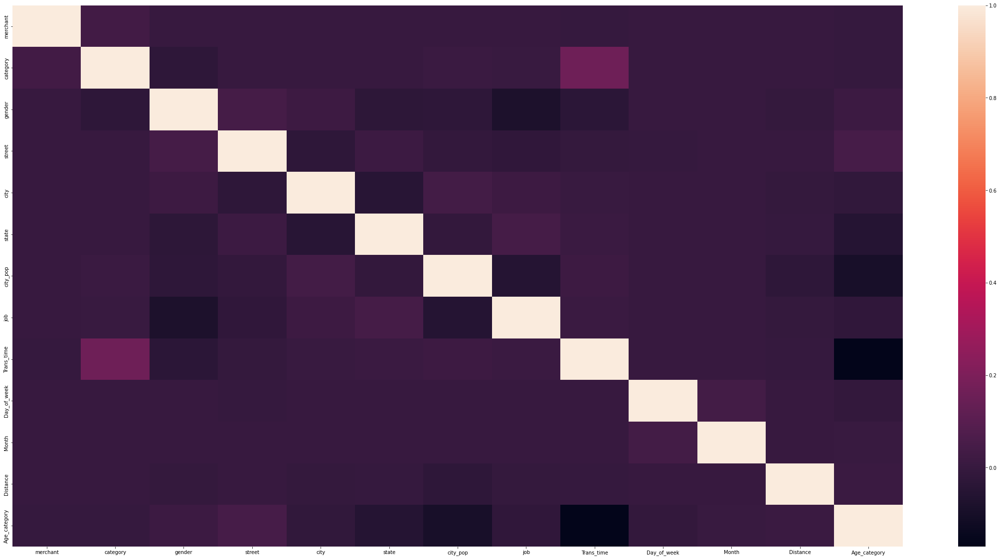

In [98]:
fig,ax=plt.subplots(figsize=(40,20))
sns.heatmap(X_train_lg.corr())
plt.show()

In [907]:
lgrg=LogisticRegression()

In [908]:
from sklearn.feature_selection import RFE
rfe=RFE(lgrg,n_features_to_select=10)
rfe=rfe.fit(X_train_lg,y_train)

In [909]:
list(zip(X_train_lg.columns, rfe.support_, rfe.ranking_))

[('merchant', False, 2),
 ('category', True, 1),
 ('gender', True, 1),
 ('street', False, 4),
 ('city', False, 3),
 ('state', True, 1),
 ('city_pop', True, 1),
 ('job', True, 1),
 ('Trans_time', True, 1),
 ('Day_of_week', True, 1),
 ('Month', True, 1),
 ('Distance', True, 1),
 ('Age_category', True, 1)]

In [910]:
#store columns selected from rfe
rfe_col=X_train_lg.columns[rfe.support_]

In [911]:
X_train_lg=X_train_lg[rfe_col]
X_train_lg.head()

,category,gender,state,city_pop,job,Trans_time,Day_of_week,Month,Distance,Age_category
267436,7,1,22,0.001531,150,18,6,5,0.376031,3
233159,7,0,17,0.000110,71,21,5,4,0.642221,4
430072,2,1,15,0.001984,134,2,4,7,0.718947,4
236662,7,0,13,0.028928,251,23,6,4,0.510120,3
450357,6,1,35,0.002154,416,12,4,7,0.540952,7


**Fitting the Logistic regression model**

In [912]:
import statsmodels.api as sm
X_train_sm=sm.add_constant(X_train_lg)
model=sm.GLM(y_train,X_train_sm, family=sm.families.Binomial())
op=model.fit()
op.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               is_fraud   No. Observations:               972506
Model:                            GLM   Df Residuals:                   972495
Model Family:                Binomial   Df Model:                           10
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -34102.
Date:                Sat, 13 May 2023   Deviance:                       68204.
Time:                        00:43:56   Pearson chi2:                 1.05e+06
No. Iterations:                     9   Pseudo R-squ. (CS):           0.001050
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -6.3994      0.077    -83.310      0.000      -6.550      -6.249
category         0.0630      0.004     17.989      0.000       0.056       0.070
gender           0.2528      0.027      9.394      0.000       0.200       0.305
state            0.0036      0.001      3.818      0.000       0.002       0.005
city_pop         0.4404      0.120      3.667      0.000       0.205       0.676
job            8.08e-05    9.6e-05      0.842      0.400      -0.000       0.000
Trans_time       0.0313      0.002     14.949      0.000       0.027       0.035
Day_of_week      0.0149      0.006      2.433      0.015       0.003       0.027
Month           -0.0484      0.004    -11.965      0.000      -0.056      -0.040
Distance         0.0681      0.065      1.050      0.294      -0.059       0.195
Age_category     0.1120      0.007     14.995      0.000       0.097       0.127
================================================================================
"""

**We need to remove variables job, Distance as they are having insignificant p-values**

In [913]:
X_train_lg=X_train_lg.drop(['job','Distance'],1)

In [914]:
X_train_lg.columns

Index(['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week',
       'Month', 'Age_category'],
      dtype='object')

In [915]:
X_train_sm=sm.add_constant(X_train_lg)
model=sm.GLM(y_train,X_train_sm, family=sm.families.Binomial())
op=model.fit()
op.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               is_fraud   No. Observations:               972506
Model:                            GLM   Df Residuals:                   972497
Model Family:                Binomial   Df Model:                            8
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -34103.
Date:                Sat, 13 May 2023   Deviance:                       68206.
Time:                        00:45:43   Pearson chi2:                 1.05e+06
No. Iterations:                     9   Pseudo R-squ. (CS):           0.001048
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
const           -6.3460      0.066    -96.778      0.000      -6.475      -6.217
category         0.0631      0.004     17.992      0.000       0.056       0.070
gender           0.2507      0.027      9.345      0.000       0.198       0.303
state            0.0036      0.001      3.848      0.000       0.002       0.005
city_pop         0.4295      0.120      3.589      0.000       0.195       0.664
Trans_time       0.0313      0.002     14.953      0.000       0.027       0.035
Day_of_week      0.0149      0.006      2.433      0.015       0.003       0.027
Month           -0.0484      0.004    -11.963      0.000      -0.056      -0.040
Age_category     0.1119      0.007     14.988      0.000       0.097       0.126
================================================================================
"""

**No variables with in-significant p-value**

**Now we need check the VIF values**

In [916]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df=pd.DataFrame()
vif_df['features/columns']=X_train_lg.columns
vif_df['VIF']= [variance_inflation_factor(X_train_lg.values,a) for a in range(X_train_lg.shape[1])]
vif_df

,features/columns,VIF
0,category,3.339063
1,gender,1.733860
2,state,3.618488
3,city_pop,1.084355
4,Trans_time,3.857374
5,Day_of_week,2.695819
6,Month,3.627396
7,Age_category,3.221223


In [917]:
vif_df1=vif_df.sort_values(by="VIF", ascending=True)
vif_df1

,features/columns,VIF
3,city_pop,1.084355
1,gender,1.733860
5,Day_of_week,2.695819
7,Age_category,3.221223
0,category,3.339063
2,state,3.618488
6,Month,3.627396
4,Trans_time,3.857374


**Therefore all the 8 variables/features have significant p-value and VIF**

**Now need to calculate the probability of leads getting fraud transactions**

In [918]:
y_train_pred=op.predict(X_train_sm)

In [919]:
y_train_pred_final = pd.DataFrame({'fraud':y_train.values, 'probability':y_train_pred})
y_train_pred_final.head()

,fraud,probability
267436,0,0.007951
233159,0,0.007716
430072,0,0.003392
236662,0,0.007442
450357,0,0.008933


**Keeping the threshold as 0.6 ie any transaction having probability more than 0.6 would be fraud and below it will not be fraud**

In [920]:
y_train_pred_final['fraud_prediction']=y_train_pred_final.probability.map(lambda a:1 if a >0.6 else 0)
y_train_pred_final.head()

,fraud,probability,fraud_prediction
267436,0,0.007951,0
233159,0,0.007716,0
430072,0,0.003392,0
236662,0,0.007442,0
450357,0,0.008933,0


In [921]:
y_train_pred_final1=y_train_pred_final

**Evaluating the performance of model**

In [922]:
from sklearn import metrics
confusion = metrics.confusion_matrix(y_train_pred_final['fraud'], y_train_pred_final['fraud_prediction'])
confusion

array([[966877,      0],
       [  5629,      0]], dtype=int64)

In [923]:
#calculate overall accuracy of the model
metrics.accuracy_score(y_train_pred_final['fraud'], y_train_pred_final['fraud_prediction'])

0.994211860903686

In [924]:
TP=confusion[1,1]
TN=confusion[0,0]
FP=confusion[0,1]
FN=confusion[1,0]

**Checking false positive rate**

In [925]:
FPR = FP / (TN + FP)
FPR

0.0

**Model does not wrongly identify fraud customer as genuine customer**

**Checking Recall**

In [926]:
Recall = TP / (TP + FN)
Recall

0.0

**Model is failing to identify the positive classes, so we need to try fitting model with other algorithms/ tune hyper parameters**

In [927]:
lg_imbalanced = LogisticRegression(random_state=42).fit(X_train_lg,y_train)

**Hyper parameter tuning**

In [928]:
from sklearn.model_selection import GridSearchCV

params_lg = {'C':[0.01,0.1,0.5,1,2,3,4,10],
             'penalty':['l1','l2']}

grid_search_lg = GridSearchCV(estimator=lg_imbalanced,
                              param_grid=params_lg,
                              cv=5,
                              n_jobs=-1,verbose=1,
                              scoring='recall')


In [929]:
%%time 
grid_search_lg.fit(X_train_lg,y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
CPU times: total: 35.5 s
Wall time: 4min 55s


GridSearchCV(cv=5, estimator=LogisticRegression(random_state=42), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 0.5, 1, 2, 3, 4, 10],
                         'penalty': ['l1', 'l2']},
             scoring='recall', verbose=1)

In [930]:
grid_search_lg.best_score_

0.0

In [931]:
# Creating a Function for evaluating the model 

def evaluate_model_lg (model):
  y_train_pred = model.predict(X_train_lg)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

In [932]:
X_train_lg.columns

Index(['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week',
       'Month', 'Age_category'],
      dtype='object')

In [933]:
# evaluating model using best parameter values
 
model_lg_imbalanced = grid_search_lg.best_estimator_
model_lg_imbalanced

LogisticRegression(C=0.01, random_state=42)

In [935]:
X_test= X_test[['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week','Month', 'Age_category']]

In [936]:
evaluate_model_lg(model_lg_imbalanced)

Train set performance
Recall :  0.0
Confusion Matrix : 
[[966877      0]
 [  5629      0]]
------------------------------
Test set performance
Recall :  0.9994672349493873
Confusion Matrix : 
[[   493 321799]
 [     1   1876]]


**Since the data imbalance hasn't been mitigated, the model predicts almost all the transactions as 'not fraud'. Hence we need to balance the classes in target variable in order to build a decent model.**

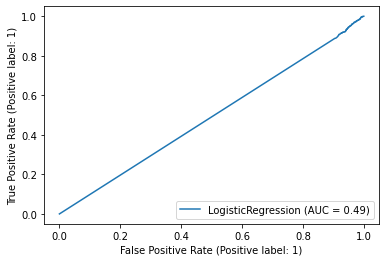

In [937]:
# Let's plot the roc curve and check AUC score 

plot_roc_curve(model_lg_imbalanced,X_test,y_test)

**Logistic Regression IMBALANCE - Metrics: Train Recall : 0.0 Test Recall : 0.99 AUC : 0.49**

**Logistic Regression - SMOTE**

In [938]:
X_train_lg_smote,y_train_lg_smote = SMOTE().fit_resample(X_train_lg,y_train)

In [939]:
lg_smote = LogisticRegression().fit(X_train_lg_smote,y_train_lg_smote)

**Hyper parameter tuning**

In [940]:
params_lg = {'C':[0.01,0.1,0.5,1,2,3,4,10],
             'penalty':['l1','l2']}

grid_search_lg_smote = GridSearchCV(estimator=lg_smote,
                              param_grid=params_lg,
                              cv=5,
                              n_jobs=-1,verbose=1,
                              scoring='recall')

In [944]:
%%time 
grid_search_lg_smote.fit(X_train_lg_smote,y_train_lg_smote)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
CPU times: total: 1min 20s
Wall time: 18min 59s


0.5859938733303375

In [945]:
grid_search_lg_smote.best_score_

0.5859938733303375

In [946]:
# Creating a Function for evaluating the model 

def evaluate_model_lg_smote (model):
  y_train_pred = model.predict(X_train_lg_smote)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train_lg_smote,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train_lg_smote,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

In [947]:
model_lg_smote = grid_search_lg_smote.best_estimator_ 
evaluate_model_lg_smote(model_lg_smote)

Train set performance
Recall :  0.585428136153823
Confusion Matrix : 
[[550756 416121]
 [400840 566037]]
------------------------------
Test set performance
Recall :  1.0
Confusion Matrix : 
[[     0 322292]
 [     0   1877]]


**As we can see test recall is double the train recall, which indicates that the model is overfitting**

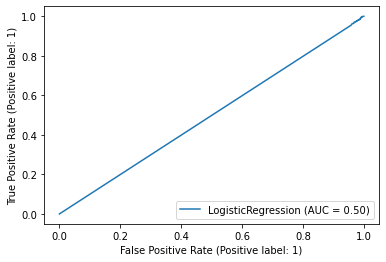

In [948]:
#### ROC curve

# Let's plot the roc curve and check AUC score 

plot_roc_curve(model_lg_smote,X_test,y_test)

**Logistic Regression SMOTE - Metrics: Train Recall : 0.58 Test Recall : 1.0 AUC : 0.50**

**Logistic Regression - ADASYN**

In [949]:
X_train_lg_ada,y_train_lg_ada = ADASYN().fit_resample(X_train_lg,y_train)

In [950]:
lg_ada = LogisticRegression().fit(X_train_lg_ada,y_train_lg_ada)

**Hyper parameter tuning**

In [951]:
params_lg = {'C':[0.01,0.1,0.5,1,2,3,4,10],
             'penalty':['l1','l2']}

grid_search_lg_ada = GridSearchCV(estimator=lg_ada,
                              param_grid=params_lg,
                              cv=5,
                              n_jobs=-1,verbose=1,
                              scoring='recall')

In [952]:
%%time 
grid_search_lg_ada.fit(X_train_lg_ada,y_train_lg_ada)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
CPU times: total: 1min 5s
Wall time: 12min 35s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [0.01, 0.1, 0.5, 1, 2, 3, 4, 10],
                         'penalty': ['l1', 'l2']},
             scoring='recall', verbose=1)

In [953]:
grid_search_lg_ada.best_score_

0.5781901881136696

In [955]:
# Creating a Function for evaluating the model 

def evaluate_model_lg_ada (model):
  y_train_pred = model.predict(X_train_lg_ada)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train_lg_ada,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train_lg_ada,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

In [956]:
model_lg_ada = grid_search_lg_ada.best_estimator_ 
evaluate_model_lg_ada(model_lg_ada)

Train set performance
Recall :  0.5774253576869577
Confusion Matrix : 
[[542587 424290]
 [408295 557913]]
------------------------------
Test set performance
Recall :  1.0
Confusion Matrix : 
[[     0 322292]
 [     0   1877]]


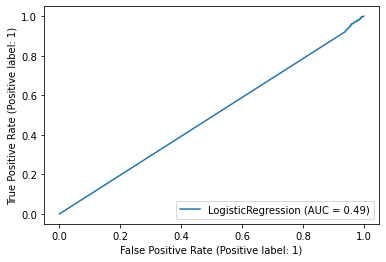

In [957]:
# Let's plot the roc curve and check AUC score 

plot_roc_curve(model_lg_ada,X_test,y_test)

**Logistic Regression ADASYN - Metrics: Train Recall : 0.57 Test Recall : 1.0 AUC : 0.49**

**Model is overfitting**

**FITTING DECISSION TREE**

In [99]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.tree import plot_tree

**Trying out different techniques with the significant categories previously identified before building logistic regression model**

In [100]:
X_train= X_train[['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week',
       'Month', 'Age_category']]

In [101]:
X_test = X_test[['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week',
       'Month', 'Age_category']]

In [102]:
from sklearn.model_selection import train_test_split 

X_train,X_test,y_train,y_test= train_test_split(X,y,stratify=y,random_state=42)

**Function to evaluate performance of model**

In [103]:
def evaluate_model_imbalanced (model):
  y_train_pred = model.predict(X_train)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

**Fitting the model**

In [104]:
dt_imbalanced = DecisionTreeClassifier(random_state=42)

In [105]:
dt_imbalanced.fit(X_train_lg,y_train)

DecisionTreeClassifier(random_state=42)

**Hyper parameter tuning**

In [106]:
# Creating the parameter grid based on results of random search 

params = { 
    'max_depth':[3,5,7],
    'min_samples_leaf':[50,60,70,80,90,100,120],
    'max_features':[3,5,7],
    'criterion':['gini']
}

from sklearn.model_selection import GridSearchCV
grid_search_dt = GridSearchCV(estimator = dt_imbalanced,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [107]:
%%time
grid_search_dt.fit(X_train,y_train)

CPU times: total: 12.9 s
Wall time: 5min 8s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7],
                         'max_features': [3, 5, 7],
                         'min_samples_leaf': [50, 60, 70, 80, 90, 100, 120]},
             scoring='recall', verbose=-1)

**Evaluating the score**

In [108]:
grid_search_dt.best_score_

0.18865569370436158

**Finding the best combination of parameters which provide best optimisation**

In [109]:
model_dt = grid_search_dt.best_estimator_ 
model_dt

DecisionTreeClassifier(max_depth=7, max_features=7, min_samples_leaf=50,
                       random_state=42)

**Evaluating performance of the model**

In [110]:
evaluate_model_imbalanced(model_dt)

Train set performance
Recall :  0.23574347130929116
Confusion Matrix : 
[[966838     39]
 [  4302   1327]]
------------------------------
Test set performance
Recall :  0.22535961640916355
Confusion Matrix : 
[[322280     12]
 [  1454    423]]


**Plotting ROC curve**

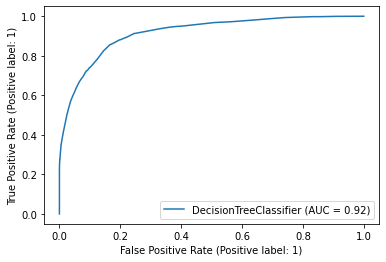

In [111]:
plot_roc_curve(model_dt,X_test,y_test)

**Decison Tree Imbalanced - Metrics: Train Recall : 0.235 Test Recall : 0.225 AUC : 0.92**

**As Recall score is low and the class imbalance needs to be handled, we proceed with**

**Decision Tree - SMOTE**

In [972]:
X_train_smote,y_train_smote = SMOTE().fit_resample(X_train,y_train)

In [973]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)

In [974]:
# Creating a Function for evaluating the model 

def evaluate_model_smote(model):
  y_train_pred = model.predict(X_train_smote)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train_smote,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train_smote,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

In [975]:
# Creating the parameter grid based on results of random search 

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[50,60,70,80,90,100,120],
    'max_features':[1,2,3,4,5,6,7],
    'criterion':['gini']
}


grid_search_dt_smote = GridSearchCV(estimator = dt_smote,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [976]:
%%time 
grid_search_dt_smote.fit(X_train_smote,y_train_smote)

CPU times: total: 15.9 s
Wall time: 1h 3min 23s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'max_features': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_leaf': [50, 60, 70, 80, 90, 100, 120]},
             scoring='recall', verbose=-1)

In [977]:
grid_search_dt_smote.best_score_

0.9235838661056655

In [978]:
model_dt_smote = grid_search_dt_smote.best_estimator_ 

model_dt_smote

DecisionTreeClassifier(max_depth=3, max_features=3, min_samples_leaf=50,
                       random_state=42)

In [979]:
evaluate_model_smote(model_dt_smote)

Train set performance
Recall :  0.9233552975197465
Confusion Matrix : 
[[143666 823211]
 [ 74106 892771]]
------------------------------
Test set performance
Recall :  0.8758657432072456
Confusion Matrix : 
[[ 48013 274279]
 [   233   1644]]


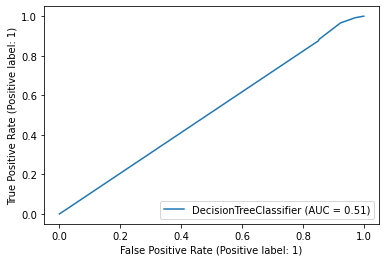

In [980]:
plot_roc_curve(model_dt_smote,X_test,y_test)

**Model fails to perform on test data**

**Decision Tree SMOTE - Metrics : Train Recall : 0.92 Test Recall : 0.88 AUC : 0.51**

**From above, it can be observed that SMOTE sampling method for balancing the dataset is quite in-efficient as the model does not generalise well.**

**Decision Tree - ADASYN**

In [981]:
X_train_ada,y_train_ada = ADASYN().fit_resample(X_train,y_train)

In [982]:
# Creating a Function for evaluating the model 

def evaluate_model_ada(model):
  y_train_pred = model.predict(X_train_ada)
  y_test_pred = model.predict(X_test)

  print("Train set performance")
  print("Recall : ", recall_score(y_train_ada,y_train_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_train_ada,y_train_pred))
  print("-"*30)
  
  print("Test set performance")
  print("Recall : ", recall_score(y_test,y_test_pred))
  print("Confusion Matrix : ")
  print(confusion_matrix(y_test,y_test_pred))

In [983]:
dt_ada = DecisionTreeClassifier(random_state=42).fit(X_train_ada,y_train_ada)

In [984]:
# creating the parameter grid using the one finalised in Decision Tree SMOTE model 

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[50,60,70,80,90,100,120],
    'max_features':[1,2,3,4,5,6,7],
    'criterion':['gini']
}

grid_search_dt_ada = GridSearchCV(estimator = dt_ada,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [985]:
%%time
grid_search_dt_ada.fit(X_train_ada,y_train_ada)

CPU times: total: 12.5 s
Wall time: 52min 8s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'max_features': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_leaf': [50, 60, 70, 80, 90, 100, 120]},
             scoring='recall', verbose=-1)

In [986]:
grid_search_dt_ada.best_score_

0.9205655197584062

In [987]:
model_dt_ada = grid_search_dt_ada.best_estimator_
model_dt_ada

DecisionTreeClassifier(max_depth=3, max_features=1, min_samples_leaf=50,
                       random_state=42)

In [988]:
evaluate_model_ada(model_dt_ada)

Train set performance
Recall :  0.9290409959565689
Confusion Matrix : 
[[196281 770596]
 [ 68477 896545]]
------------------------------
Test set performance
Recall :  0.8268513585508791
Confusion Matrix : 
[[ 65472 256820]
 [   325   1552]]


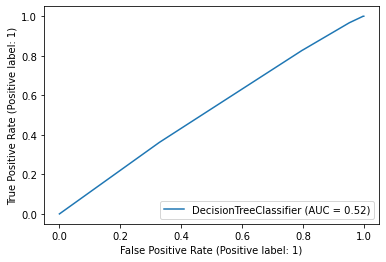

In [989]:
plot_roc_curve(model_dt_ada,X_test,y_test)

**Decision Tree ADASYN - Metrics : Train Recall : 0.92 Test Recall : 0.82 AUC : 0.52**

**Model seems to perform poor on test data as the test score has got reduced by 10%**

**Random Forest**

In [16]:
from sklearn.ensemble import RandomForestClassifier 

In [991]:
rf_imbalanced = RandomForestClassifier(random_state=42).fit(X_train,y_train)

In [992]:
# creating the parameter grid using the one finalised in Decision Tree  modeland building up on that

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[90,100],
    'criterion':['gini'],
    'n_estimators' : [10,15,20]
}


grid_search_rf = GridSearchCV(estimator = rf_imbalanced,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [993]:
%%time 
grid_search_rf.fit(X_train,y_train)

CPU times: total: 29.6 s
Wall time: 19min 21s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'min_samples_leaf': [90, 100],
                         'n_estimators': [10, 15, 20]},
             scoring='recall', verbose=-1)

In [994]:
model_rf = grid_search_rf.best_estimator_ 
model_rf

RandomForestClassifier(max_depth=9, min_samples_leaf=100, n_estimators=10,
                       random_state=42)

In [995]:
evaluate_model_imbalanced(model_rf)

Train set performance
Recall :  0.0014212115828744004
Confusion Matrix : 
[[966877      0]
 [  5621      8]]
------------------------------
Test set performance
Recall :  0.0015982951518380393
Confusion Matrix : 
[[322292      0]
 [  1874      3]]


In [996]:
grid_search_rf.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 100,
 'n_estimators': 10}

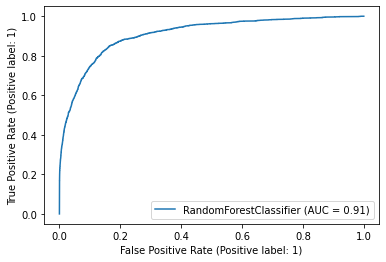

In [997]:
plot_roc_curve(model_rf,X_test,y_test)

**Therefore, if the recall is 0 but the AUC is high, it signifies that the model is confident in its negative predictions and is correctly identifying negative cases but is failing to capture positive cases.**

**Here positive cases signify the frauduelnt transaction**

**Random forest Imbalanced - Metrics : Train Recall : 0.00 Test Recall : 0.00 AUC : 0.91**

**Random Forest - SMOTE**

In [998]:
rf_smote  =  RandomForestClassifier(random_state=42).fit(X_train_smote,y_train_smote)

In [999]:
# creating the parameter grid using the one finalised in Decision Tree  modeland building up on that

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[90,100],
    'criterion':['gini'],
    'n_estimators' : [10,15,20]
}


grid_search_rf_smote = GridSearchCV(estimator = rf_smote,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [1000]:
%%time 

grid_search_rf_smote.fit(X_train_smote,y_train_smote)

CPU times: total: 1min 49s
Wall time: 58min 23s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'min_samples_leaf': [90, 100],
                         'n_estimators': [10, 15, 20]},
             scoring='recall', verbose=-1)

In [1001]:
model_rf_smote = grid_search_rf_smote.best_estimator_ 

model_rf_smote 

RandomForestClassifier(max_depth=11, min_samples_leaf=90, n_estimators=20,
                       random_state=42)

In [1002]:
evaluate_model_smote(model_rf_smote)

Train set performance
Recall :  0.8775821536762174
Confusion Matrix : 
[[699382 267495]
 [118363 848514]]
------------------------------
Test set performance
Recall :  0.7240277037826318
Confusion Matrix : 
[[232559  89733]
 [   518   1359]]


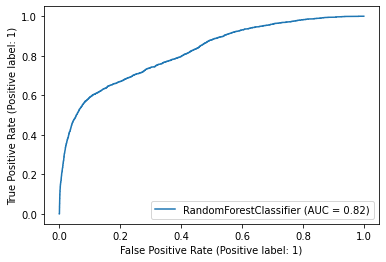

In [1003]:
plot_roc_curve(model_rf_smote,X_test,y_test)

**Random forest SMOTE - Metrics : Train Recall :0.87  Test Recall :0.72  AUC :0.82**

**Random Forest - ADASYN**

In [1004]:
rf_ada = RandomForestClassifier(random_state=42).fit(X_train_ada,y_train_ada)

In [1005]:
# creating the parameter grid using the one finalised in Decision Tree  modeland building up on that

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[90,100],
    'criterion':['gini'],
    'n_estimators' : [10,15,20]
}


grid_search_rf_ada = GridSearchCV(estimator = rf_ada,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [1006]:
%%time 

grid_search_rf_ada.fit(X_train_ada,y_train_ada)

CPU times: total: 1min 49s
Wall time: 48min 49s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'min_samples_leaf': [90, 100],
                         'n_estimators': [10, 15, 20]},
             scoring='recall', verbose=-1)

In [1007]:
grid_search_rf_ada.best_score_

0.8435766129386504

In [1008]:
model_rf_ada = grid_search_rf_ada.best_estimator_ 
model_rf_ada

RandomForestClassifier(max_depth=11, min_samples_leaf=90, n_estimators=20,
                       random_state=42)

In [1009]:
evaluate_model_ada(model_rf_ada)

Train set performance
Recall :  0.8607441073882254
Confusion Matrix : 
[[712221 254656]
 [134385 830637]]
------------------------------
Test set performance
Recall :  0.6989877464038359
Confusion Matrix : 
[[237250  85042]
 [   565   1312]]


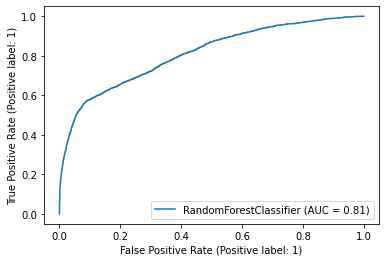

In [1010]:
plot_roc_curve(model_rf_ada,X_test,y_test)

**Random forest ADASYN - Metrics : Train Recall :0.86  Test Recall :0.70  AUC :0.81**

**Model Selection**

In [1011]:
Dict1 = {
    'Model Name' : ['Logistic Regression - Imbalanced','Logistic Regression - SMOTE','Logistic Regression - ADASYN',
                    'Decision Trees - Imbalanced','Decision Trees - SMOTE','Decision Trees- ADASYN',
                    'Random Forest - Imbalanced','Random Forest - SMOTE','Random Forest- ADASYN'],
#type all the scores below
    'Train_Recall' : [0.0,0.59,0.58,0.24,0.92,0.92,0.00,0.87,0.86],
    ' Test_Recall' : [0.99,1.0,1.0,0.23,0.88,0.82,0.00,0.72,0.70],
    ' AUC__Score'  : [0.49,0.50,0.49,0.92,0.51,0.52,0.91,0.82,0.81]
         }

Model_summary = pd.DataFrame(Dict1)
Model_summary

,Model Name,Train_Recall,Test_Recall,AUC__Score
0,Logistic Regression - Imbalanced,0.00,0.99,0.49
1,Logistic Regression - SMOTE,0.59,1.00,0.50
2,Logistic Regression - ADASYN,0.58,1.00,0.49
3,Decision Trees - Imbalanced,0.24,0.23,0.92
4,Decision Trees - SMOTE,0.92,0.88,0.51
5,Decision Trees- ADASYN,0.92,0.82,0.52
6,Random Forest - Imbalanced,0.00,0.00,0.91
7,Random Forest - SMOTE,0.87,0.72,0.82
8,Random Forest- ADASYN,0.86,0.70,0.81


In [1012]:
Model_summary.sort_values(' AUC__Score',ascending=False)

,Model Name,Train_Recall,Test_Recall,AUC__Score
3,Decision Trees - Imbalanced,0.24,0.23,0.92
6,Random Forest - Imbalanced,0.00,0.00,0.91
7,Random Forest - SMOTE,0.87,0.72,0.82
8,Random Forest- ADASYN,0.86,0.70,0.81
5,Decision Trees- ADASYN,0.92,0.82,0.52
4,Decision Trees - SMOTE,0.92,0.88,0.51
1,Logistic Regression - SMOTE,0.59,1.00,0.50
0,Logistic Regression - Imbalanced,0.00,0.99,0.49
2,Logistic Regression - ADASYN,0.58,1.00,0.49


**From the above we can observe that Random Forest - SMOTE and Random Forest- ADASYN have both high Recall and High AUC as compatred to others. So further we need to try these model of 'fraudTest.csv'.**

**Trying on Unseen Data**

In [253]:
df_test = pd.read_csv('C:/Users/deepak.ramesh/Downloads/UPGRAD/LIBA/capestone/fraudTest.csv')
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [254]:
df_test.shape

(555719, 23)

In [255]:
df_test.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [256]:
df1 = df_test.select_dtypes(exclude='number')
result = df_test.apply(pd.Series.nunique)
result

Unnamed: 0               555719
trans_date_trans_time    544760
cc_num                      924
merchant                    693
category                     14
amt                       37256
first                       341
last                        471
gender                        2
street                      924
city                        849
state                        50
zip                         912
lat                         910
long                        910
city_pop                    835
job                         478
dob                         910
trans_num                555719
unix_time                544760
merch_lat                546490
merch_long               551770
is_fraud                      2
dtype: int64

In [257]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

df_test['merchant'] = label_encoder.fit_transform(df_test['merchant'])
df_test['category'] = label_encoder.fit_transform(df_test['category'])
df_test['gender'] = label_encoder.fit_transform(df_test['gender'])
df_test['street'] = label_encoder.fit_transform(df_test['street'])
df_test['city'] = label_encoder.fit_transform(df_test['city'])
df_test['state'] = label_encoder.fit_transform(df_test['state'])
df_test['job'] = label_encoder.fit_transform(df_test['job'])
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,319,10,2.86,Jeff,Elliott,1,341,157,39,29209,33.9659,-80.9355,333497,275,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,591,10,29.84,Joanne,Williams,0,354,16,43,84002,40.3207,-110.4360,302,392,1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,611,5,41.28,Ashley,Lopez,0,865,61,33,11710,40.6729,-73.5365,34496,259,1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,222,9,60.05,Brian,Williams,1,320,764,8,32780,28.5697,-80.8191,54767,407,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,292,13,3.19,Nathan,Massey,1,548,247,21,49632,44.2529,-85.0170,1126,196,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [258]:
df_test['Trans_time'] = pd.to_datetime(df_test['trans_date_trans_time']).dt.hour

df_test['Trans_date'] = pd.to_datetime(df_test['trans_date_trans_time']).dt.date
df_test['Trans_date'] = pd.to_datetime(df_test['Trans_date'])

df_test['dob']= pd.to_datetime(df_test['dob'])

df_test['Present_Age'] = round((df_test['Trans_date'] - df_test['dob'])/np.timedelta64(1, 'Y'))

df_test['Day_of_week'] = df_test.Trans_date.dt.dayofweek

df_test['Month'] = df_test['Trans_date'].dt.month

def Haversinedist(lat1,long1,lat2,long2):
  R = 6373.0
  dlat = radians(lat2-lat1)
  dlong = radians(long2-long1)
  a =  math.sin(dlat / 2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlong / 2)**2
  c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
  d = R*c
  return round(d,4)

Dist = []

for p,q,r,s in zip(df_test['lat'],df_test['long'],df_test['merch_lat'],df_test['merch_long']):
  Dist.append(Haversinedist(p,q,r,s))

df_test['Distance']= Dist
df_test.head()

df_test['Present_Age'].max(), df_test['Present_Age'].min()

df_test['Age_category'] = pd.cut(x=df_test['Present_Age'], bins=[0,10,20,30,40,50,60,70,80,90,100],labels=['0-10','10-20','20-30','30-40','40-50','50-60','60-70','70-80','80-90','90-100'])

df_test['Age_category'].value_counts()

df_test['Age_category'] = label_encoder.fit_transform(df_test['Age_category'])

df_test1 = df_test.drop(['trans_date_trans_time','first','last','lat','long', 'Unnamed: 0','cc_num', 'zip', 'amt', 'trans_num', 'unix_time','merch_lat','merch_long'],axis=1)

classes = df_test1['is_fraud'].value_counts()
normal_trans = classes[0]/df_test1['is_fraud'].count()*100
fraud_trans = classes [1]/df_test1['is_fraud'].count()*100
normal_trans,fraud_trans

(99.61401355721146, 0.3859864427885316)

**Therefore the test data is also containing class imbalance. We will be handling it later.**

In [259]:
df_test1.head()

,merchant,category,gender,street,city,state,city_pop,job,dob,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
0,319,10,1,341,157,39,333497,275,1968-03-19,0,12,2020-06-21,52.0,6,6,24.7565,4
1,591,10,0,354,16,43,302,392,1990-01-17,0,12,2020-06-21,30.0,6,6,99.0198,1
2,611,5,0,865,61,33,34496,259,1970-10-21,0,12,2020-06-21,50.0,6,6,73.3674,3
3,222,9,1,320,764,8,54767,407,1987-07-25,0,12,2020-06-21,33.0,6,6,27.7547,2
4,292,13,1,548,247,21,1126,196,1955-07-06,0,12,2020-06-21,65.0,6,6,105.8054,5


**Considering the same variables as considered in training set**

In [260]:
df_test2 = df_test1[['category', 'gender', 'state', 'city_pop', 'Trans_time', 'Day_of_week','Month', 'Age_category','is_fraud']]
df_test2.head()

,category,gender,state,city_pop,Trans_time,Day_of_week,Month,Age_category,is_fraud
0,10,1,39,333497,12,6,6,4,0
1,10,0,43,302,12,6,6,1,0
2,5,0,33,34496,12,6,6,3,0
3,9,1,8,54767,12,6,6,2,0
4,13,1,21,1126,12,6,6,5,0


In [261]:
X = df_test2.drop('is_fraud',axis=1)
y = df_test2['is_fraud'] # Target Variable

In [262]:
X_train1,X_test1,y_train1,y_test1= train_test_split(X,y,stratify=y,random_state=42)

X_train1.shape,X_test1.shape

((416789, 8), (138930, 8))

**Random Forest SMOTE**

In [263]:
X_train_smote1,y_train_smote1 = SMOTE().fit_resample(X_train1,y_train1)

In [264]:
rf_smote1  =  RandomForestClassifier(random_state=42).fit(X_train_smote1,y_train_smote1)

In [265]:
# creating the parameter grid using the one finalised in Decision Tree  modeland building up on that

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[90,100],
    'criterion':['gini'],
    'n_estimators' : [10,15,20]
}

grid_search_rf_smote1 = GridSearchCV(estimator = rf_smote1,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [28]:
%%time 

grid_search_rf_smote1.fit(X_train_smote1,y_train_smote1)

CPU times: total: 18.5 s
Wall time: 10min 57s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'min_samples_leaf': [90, 100],
                         'n_estimators': [10, 15, 20]},
             scoring='recall', verbose=-1)

In [44]:
model_rf_smote1 = grid_search_rf_smote1.best_estimator_ 

In [45]:
model_rf_smote1

RandomForestClassifier(max_depth=11, min_samples_leaf=90, n_estimators=20,
                       random_state=42)

In [47]:
y_pred_dt_smote1 = model_rf_smote1.predict(X)

print("Recall Score: ", recall_score(y,y_pred_dt_smote1))

print('-'*30)

print(confusion_matrix(y,y_pred_dt_smote1))


Recall Score:  0.8610722610722611
------------------------------
[[491345  62229]
 [   298   1847]]


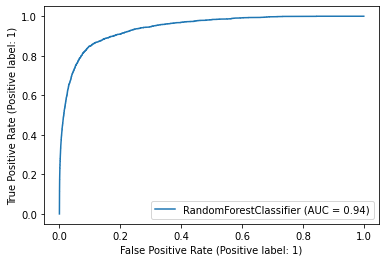

In [48]:
# roc curve 

plot_roc_curve(model_rf_smote1,X,y)

**Random forest SMOTE - Metrics : Recall :0.86 AUC :0.94**

**Random Forest ADASYN**

In [34]:
X_train_ada1,y_train_ada1 = ADASYN().fit_resample(X_train1,y_train1)

In [35]:
rf_ada1 = RandomForestClassifier(random_state=42).fit(X_train_ada1,y_train_ada1)

In [36]:
# creating the parameter grid using the one finalised in Decision Tree  modeland building up on that

params = { 
    'max_depth':[3,5,7,9,11],
    'min_samples_leaf':[90,100],
    'criterion':['gini'],
    'n_estimators' : [10,15,20]
}


grid_search_rf_ada1 = GridSearchCV(estimator = rf_ada1,
                              param_grid=params,
                              cv=5,
                              n_jobs=-1,verbose=-1,
                              scoring='recall')

In [37]:
%%time 

grid_search_rf_ada1.fit(X_train_ada1,y_train_ada1)

CPU times: total: 12.8 s
Wall time: 8min 15s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 11],
                         'min_samples_leaf': [90, 100],
                         'n_estimators': [10, 15, 20]},
             scoring='recall', verbose=-1)

In [40]:
model_rf_ada1 = grid_search_rf_ada1.best_estimator_ 

In [41]:
model_rf_ada1

RandomForestClassifier(max_depth=11, min_samples_leaf=100, n_estimators=20,
                       random_state=42)

In [42]:
y_pred_rf_ada1 = model_rf_ada1.predict(X)

print("Recall Score: ", recall_score(y,y_pred_rf_ada1))

print('-'*30)

print(confusion_matrix(y,y_pred_rf_ada1))

Recall Score:  0.8671328671328671
------------------------------
[[476836  76738]
 [   285   1860]]


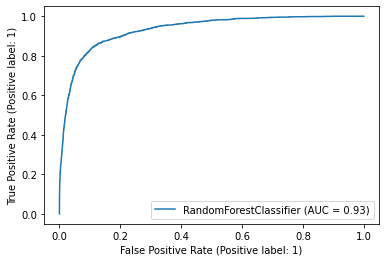

In [43]:
plot_roc_curve(model_rf_ada1,X,y)

**Random forest ADASYN - Metrics : Recall :0.87 AUC :0.93**

**CONCLUSION**

**Therefore we can go ahead and choose any among Random forest SMOTE, Random forest ADASYN as we can observe SMOTE has minute lower Recall as compared to ADASYN, whereas ADASYN has minute lower AUC than SMOTE.**

**As our requirement was High Recall and low false positive rate for buidling a Ml model capable of detecting Fraudulent Transctions. After facing a trade-off we can go ahead with ADASYN which has 1% more recall than SMOTE, also this 1% wouls account to thousands of trabsactions and we cant give upon on them and lose those customers and bare the loss**

**Creating a dataframe to compare actual and predicted values**

In [112]:
y_pred_final = pd.Series(y_pred_rf_ada1)

df_pred_output = pd.concat([X,y,y_pred_final],axis=1)

df_pred_output.rename(columns={0:'y_pred'},inplace= True)

df_pred_output.head()

,merchant,category,gender,street,city,state,city_pop,job,Trans_time,Day_of_week,Month,Distance,Age_category,is_fraud,y_pred
0,514,8,0,568,526,27,3495,370,0,1,1,10.5130,2,0,0.0
1,241,4,0,435,612,47,149,428,0,1,1,30.1809,3,0,0.0
2,390,0,1,602,468,13,4154,307,0,1,1,107.7801,4,0,0.0
3,360,2,1,930,84,26,1939,328,0,1,1,97.6600,4,0,0.0
4,297,9,1,418,216,45,99,116,0,1,1,66.2568,2,0,0.0


**lets extract only Fraud Transactions from this Unseen Test dataset**

In [113]:
df_pred_output.Month.value_counts()

5     146875
6     143811
3     143789
12    141060
4     134970
1     104727
2      97657
8      87359
7      86596
9      70652
11     70421
10     68758
Name: Month, dtype: int64

**Fraudulent transactions**

In [115]:
fraud = df_pred_output[df_pred_output['is_fraud']==1]

fraud.head()

,merchant,category,gender,street,city,state,city_pop,job,Trans_time,Day_of_week,Month,Distance,Age_category,is_fraud,y_pred
2449,543,4,1,544,165,27,885,425,1,2,1,46.9040,1,1,1.0
2472,285,2,0,280,725,43,1595797,228,1,2,1,42.8870,4,1,1.0
2523,196,4,0,280,725,43,1595797,228,3,2,1,26.8440,4,1,0.0
2546,162,2,1,544,165,27,885,425,3,2,1,11.7315,1,1,0.0
2553,328,4,0,280,725,43,1595797,228,3,2,1,38.7194,4,1,0.0


In [181]:
fraud.y_pred.value_counts()

0.0    2848
1.0     393
Name: y_pred, dtype: int64

**Cost Benefit Analysis:**

**The Cost Benefit Analysis is done on the complete dataset to analyse the business impact and present them to relevant business stakeholders.**

**Let us merge the train and test dataset to form the complete dataset**

In [117]:
df_final = pd.concat([df_train,df_test],axis=0)

df_final.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
0,0,2019-01-01 00:00:18,2703186189652095,514,8,4.97,Jennifer,Banks,0,568,526,27,28654,36.0788,-81.1781,3495,370,1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0,0,2019-01-01,31.0,1,1,10.5130,2
1,1,2019-01-01 00:00:44,630423337322,241,4,107.23,Stephanie,Gill,0,435,612,47,99160,48.8878,-118.2105,149,428,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0,0,2019-01-01,41.0,1,1,30.1809,3
2,2,2019-01-01 00:00:51,38859492057661,390,0,220.11,Edward,Sanchez,1,602,468,13,83252,42.1808,-112.2620,4154,307,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0,0,2019-01-01,57.0,1,1,107.7801,4
3,3,2019-01-01 00:01:16,3534093764340240,360,2,45.00,Jeremy,White,1,930,84,26,59632,46.2306,-112.1138,1939,328,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0,0,2019-01-01,52.0,1,1,97.6600,4
4,4,2019-01-01 00:03:06,375534208663984,297,9,41.96,Tyler,Garcia,1,418,216,45,24433,38.4207,-79.4629,99,116,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0,0,2019-01-01,33.0,1,1,66.2568,2


In [248]:
df_final.shape

(1852394, 30)

**Let us take a look at what you need to do in order to perform the cost-benefit analysis step by step:**

**Part I: Analyse the dataset and find the following figures:**

**-Average number of transactions per month**

**-Average number of fraudulent transactions per month**

**-Average amount per fraudulent transaction**

In [118]:
#Total number of Transactions can be found by checking the shape of the dataset 

In [119]:
# Avg Transactions per month can be found by dividing it by 24 (since the dataset is of 24 months from Jan 2019 to Dec 2020)

In [120]:
Avg_Trans_Pm = df_final.shape[0]//24 

print("1. Average Number of Transactions per month are :",Avg_Trans_Pm)

1. Average Number of Transactions per month are : 77183


In [121]:
# Considering only Fraudulent Transactions 

df_final[df_final['is_fraud']==1]

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,Trans_time,Trans_date,Present_Age,Day_of_week,Month,Distance,Age_category
2449,2449,2019-01-02 01:06:37,4613314721966,543,4,281.06,Jason,Murphy,1,544,165,27,28611,35.9946,-81.7266,885,425,1988-09-15,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,36.430124,-81.179483,1,1,2019-01-02,30.0,2,1,46.9040,1
2472,2472,2019-01-02 01:47:29,340187018810220,285,2,11.52,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,bc7d41c41103877b03232f03f1f8d3f5,1325468849,29.819364,-99.142791,1,1,2019-01-02,58.0,2,1,42.8870,4
2523,2523,2019-01-02 03:05:23,340187018810220,196,4,276.31,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,b98f12f4168391b2203238813df5aa8c,1325473523,29.273085,-98.836360,1,3,2019-01-02,58.0,2,1,26.8440,4
2546,2546,2019-01-02 03:38:03,4613314721966,162,2,7.03,Jason,Murphy,1,544,165,27,28611,35.9946,-81.7266,885,425,1988-09-15,397894a5c4c02e3c61c784001f0f14e4,1325475483,35.909292,-82.091010,1,3,2019-01-02,30.0,2,1,11.7315,1
2553,2553,2019-01-02 03:55:47,340187018810220,328,4,275.73,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,7863235a750d73a244c07f1fb7f0185a,1325476547,29.786426,-98.683410,1,3,2019-01-02,58.0,2,1,38.7194,4
2937,2937,2019-01-02 13:38:08,4613314721966,421,11,844.80,Jason,Murphy,1,544,165,27,28611,35.9946,-81.7266,885,425,1988-09-15,248c2746e78f2ec713df51254ff1b302,1325511488,35.987802,-81.254332,1,13,2019-01-02,30.0,2,1,7.2176,1
3527,3527,2019-01-02 23:52:08,4613314721966,535,8,843.91,Jason,Murphy,1,544,165,27,28611,35.9946,-81.7266,885,425,1988-09-15,2f7d497f607396ab669c14c2abe3886f,1325548328,35.985612,-81.383306,1,23,2019-01-02,30.0,2,1,5.3521,1
3580,3580,2019-01-03 01:05:27,340187018810220,103,2,10.76,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,0a2f8002e55a3565c5c88d8cf039fed8,1325552727,28.856712,-97.794207,1,1,2019-01-03,58.0,3,1,77.5186,4
3600,3600,2019-01-03 01:35:52,340187018810220,328,4,332.35,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,97903213a2fd7e53bbaa60807144a505,1325554552,29.320662,-97.937219,1,1,2019-01-03,58.0,3,1,28.9999,4
3671,3671,2019-01-03 03:17:36,340187018810220,608,4,315.34,Misty,Hart,0,280,725,43,78208,29.4400,-98.4590,1595797,228,1960-10-28,0ffc2b7dae4c33883f14ac60283d4027,1325560656,28.953283,-97.806528,1,3,2019-01-03,58.0,3,1,67.4273,4


**There a Total of 9651 Fraudulent Transactions spread across 24 months.**

In [122]:
# Average Fraudulent Transactions 

Avg_Fraud_Trans_Pm = df_final[df_final['is_fraud']==1].shape[0]//24

print("2. Average Number of Fraudulent Transactions per month are :",Avg_Fraud_Trans_Pm)

2. Average Number of Fraudulent Transactions per month are : 402


In [123]:
# Average amount Per Fraudulent Transaction 

Avg_Fraud_Amt = df_final[df_final['is_fraud']==1].amt.sum()//df_final[df_final['is_fraud']==1].shape[0]

In [124]:
print("3. Average Amount Per Fraudulent Transactions is : ",Avg_Fraud_Amt)

3. Average Amount Per Fraudulent Transactions is :  530.0


#### Part II: Compare the cost incurred per month by the bank before and after the model deployment:

**Calculating the cost incurred per month before the model was deployed**

In [125]:
Cost_incurred_before = Avg_Fraud_Amt*Avg_Fraud_Trans_Pm

Cost_incurred_before

213060.0

In [190]:
print("Cost incurred per month before the model is built and deployed= $",Cost_incurred_before)

Cost incurred per month before the model is built and deployed= $ 213060.0


**let TF be the average number of transactions per month detected as fraudulent by the model**

In [174]:
TF = fraud.y_pred.sum()//14 
# Since the Test dataset  has 7 months Jan 2019 to Dec 2019 and the same 7 months from Jan 2020 to Dec 2020, so total of 14 months
TF

28.0

**The cost of providing customer executive support per fraudulent transaction detected by the model = $1.5**

In [187]:
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =$",TF*1.5)

Total cost of providing customer support per month for fraudulent transactions detected by the model =$ 42.0


**Let FN be the average number of transactions per month that are fraudulent but not detected by the model**

In [182]:
FN  = fraud[fraud['y_pred']==0].is_fraud.sum()//14

FN

203

In [188]:
print("Cost incurred due to these fraudulent transactions left undetected by the model =$",FN*Avg_Fraud_Amt)

Cost incurred due to these fraudulent transactions left undetected by the model =$ 107590.0


**Cost incurred per month after the model is built and deployed**

In [249]:
Cost_incurred_after = (TF*1.5)+(FN*Avg_Fraud_Amt)

Cost_incurred_after

107632.0

In [189]:
print("Cost incurred per month after the model is built and deployed= $",Cost_incurred_after)

Cost incurred per month after the model is built and deployed= $ 107632.0


In [185]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(Cost_incurred_before-Cost_incurred_after)

print("Final Savings After Deploying the model = $",Final_Savings)

Final Savings After Deploying the model = $ 105428
